In [1]:
import os
import random
import glob
import shutil
import warnings

import cv2
import scipy
import numpy as np
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
import albumentations as A
from sklearn.preprocessing import LabelEncoder
from PIL import Image
# from albumentations.pytorch import ToTensor

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn.utils import spectral_norm
from torch.optim import Adam
from torch.optim.lr_scheduler import LambdaLR
from torch.utils.data import DataLoader, Dataset
from torchvision.utils import make_grid, save_image


%matplotlib inline
warnings.filterwarnings('ignore', category=FutureWarning)
device = 'cuda' if torch.cuda.is_available() else 'cpu'
from albumentations.pytorch import ToTensorV2

In [4]:
config = {'DataLoader': {'batch_size': 128,
                         'shuffle': True},
          'Generator': {'latent_dim': 120,
                        'embed_dim': 32,
                        'ch': 64,
                        'num_classes': 120,
                        'use_attn': True},
          'Discriminator': {'ch': 64,
                            'num_classes': 120,
                            'use_attn': True},
          'sample_latents': {'latent_dim': 120,
                             'num_classes': 120},
          'num_iterations': 26000,
          'decay_start_iteration': 25000,
          'd_steps': 1,
          'lr_G': 2e-4,
          'lr_D': 4e-4,
          'betas': (0.0, 0.999),
          'margin': 1.0,
          'gamma': 0.1,
          'ema': 0.999,#1 
          'seed': 42}

In [33]:
def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

seed_everything(config['seed'])

In [34]:
root_images = r'C:\private\afeka\cv\gan\all-dogs'
root_annots = r'C:\private\afeka\cv\gan\Annotation\Annotation'

In [35]:
all_files = os.listdir(root_images)

In [36]:
breeds = glob.glob(root_annots+'*')
annotations = []
for breed in breeds:
    annotations += glob.glob(breed+'/*')

In [37]:
breed_map = {}
for annotation in annotations:
    breed = annotation.split('\\')[-1]
    index = breed.split('-')[0]
    breed_map.setdefault(index, breed)

In [38]:
all_labels = [breed_map[file.split('_')[0]] for file in all_files]
le = LabelEncoder()
all_labels = le.fit_transform(all_labels)

In [39]:
def load_bbox(file):
    file = str(breed_map[file.split('_')[0]]) + '/' + str(file.split('.')[0])
    path = os.path.join(root_annots, file)
    tree = ET.parse(path)
    root = tree.getroot()
    objects = root.findall('object')
    for o in objects:
        bndbox = o.find('bndbox')
        xmin = int(bndbox.find('xmin').text)
        ymin = int(bndbox.find('ymin').text)
        xmax = int(bndbox.find('xmax').text)
        ymax = int(bndbox.find('ymax').text)
    
    return (xmin, ymin, xmax, ymax)

In [40]:
all_bboxes = [load_bbox(file) for file in all_files]

In [41]:
# make square bounding boxes of original ones,
# to keep a dog's aspect ratio.

def get_resized_bbox(height, width, bbox):
    xmin, ymin, xmax, ymax = bbox
    xlen = xmax - xmin
    ylen = ymax - ymin
    
    if xlen > ylen:
        diff = xlen - ylen
        min_pad = min(ymin, diff//2)
        max_pad = min(height-ymax, diff-min_pad)
        ymin = ymin - min_pad
        ymax = ymax + max_pad

    elif ylen > xlen:
        diff = ylen - xlen
        min_pad = min(xmin, diff//2)
        max_pad = min(width-xmax, diff-min_pad)
        xmin = xmin - min_pad
        xmax = xmax + max_pad
    
    return xmin, ymin, xmax, ymax

In [42]:
resized_bboxes = []
for file, bbox in zip(all_files, all_bboxes):
    img = Image.open(os.path.join(root_images, file))
    width, height = img.size
    xmin, ymin, xmax, ymax = get_resized_bbox(height, width, bbox)
    resized_bboxes.append((xmin, ymin, xmax, ymax))

In [43]:
# crop by square bounding box -> resize and normalize.
# cv2.INTER_AREA is better than others.

def load_bboxcrop_resized_image(file, bbox):
#     print(file,root_images,os.path.join(root_images, file))
    print(os.path.join(root_images, file))
    img = cv2.imread(os.path.join(root_images, file))
    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    xmin, ymin, xmax, ymax = bbox
    img = img[ymin:ymax,xmin:xmax]

    transform = A.Compose([A.Resize(64, 64, interpolation=cv2.INTER_AREA),
                           A.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])
    img = transform(image=img)['image']
    
    return img

In [16]:
all_images = [load_bboxcrop_resized_image(f, b) for f, b in zip(all_files, resized_bboxes)]
all_images = np.array(all_images)

C:\private\afeka\cv\gan\all-dogs\n02085620_10074.jpg
C:\private\afeka\cv\gan\all-dogs\n02085620_10131.jpg
C:\private\afeka\cv\gan\all-dogs\n02085620_10621.jpg
C:\private\afeka\cv\gan\all-dogs\n02085620_1073.jpg
C:\private\afeka\cv\gan\all-dogs\n02085620_10976.jpg
C:\private\afeka\cv\gan\all-dogs\n02085620_11140.jpg
C:\private\afeka\cv\gan\all-dogs\n02085620_11238.jpg
C:\private\afeka\cv\gan\all-dogs\n02085620_11258.jpg
C:\private\afeka\cv\gan\all-dogs\n02085620_11337.jpg
C:\private\afeka\cv\gan\all-dogs\n02085620_11477.jpg
C:\private\afeka\cv\gan\all-dogs\n02085620_1152.jpg
C:\private\afeka\cv\gan\all-dogs\n02085620_11696.jpg
C:\private\afeka\cv\gan\all-dogs\n02085620_11818.jpg
C:\private\afeka\cv\gan\all-dogs\n02085620_11948.jpg
C:\private\afeka\cv\gan\all-dogs\n02085620_1205.jpg
C:\private\afeka\cv\gan\all-dogs\n02085620_12101.jpg
C:\private\afeka\cv\gan\all-dogs\n02085620_12334.jpg
C:\private\afeka\cv\gan\all-dogs\n02085620_1235.jpg
C:\private\afeka\cv\gan\all-dogs\n02085620_1271.jp

In [21]:
np.save(r'C:\private\afeka\cv\gan\data', all_images)
#in case of reactivation
# all_images = np.load(r'C:\private\afeka\cv\gan\data.npy')

In [158]:
class DogDataset(Dataset):
    def __init__(self, images, labels):
        super().__init__()
        self.images = images
        self.labels = labels
        self.transform = A.Compose([A.HorizontalFlip(p=0.5), ToTensorV2()])

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img, label = self.images[idx], self.labels[idx]
        img = self.transform(image=img)['image']
        label = torch.as_tensor(label,dtype=torch.long)# dtype=torch.float)

        return img, label

In [159]:
# adding uniform noise works well.

def get_dataiterator(images, labels, dataloader_params, device='cpu'):
    train_dataset = DogDataset(images, labels)
    train_dataloader = DataLoader(train_dataset, **dataloader_params)
    batch_size = dataloader_params['batch_size']

    while True:
        for imgs, labels in train_dataloader:
            if batch_size != imgs.size(0):
                break
            else:
                imgs, labels = imgs.to(device), labels.to(device)
                imgs += (1.0 / 128.0) * torch.rand_like(imgs)
                
                labels.float()
                
                yield imgs, labels

In [160]:
# batch size around 64 ~ 128 improves score.
# ~ 64 are too small, 128 ~ are too large (for 9 hours training). 

train_dataiterator = get_dataiterator(all_images, all_labels, config['DataLoader'], device=device)

models

In [161]:
# Attention slightly works.

class Attention(nn.Module):
    def __init__(self, channels, reduction_attn=8, reduction_sc=2):
        super().__init__()
        self.channles_attn = channels // reduction_attn
        self.channels_sc = channels // reduction_sc
        
        self.conv_query = spectral_norm(nn.Conv2d(channels, self.channles_attn, kernel_size=1, bias=False))
        self.conv_key = spectral_norm(nn.Conv2d(channels, self.channles_attn, kernel_size=1, bias=False))
        self.conv_value = spectral_norm(nn.Conv2d(channels, self.channels_sc, kernel_size=1, bias=False))
        self.conv_attn = spectral_norm(nn.Conv2d(self.channels_sc, channels, kernel_size=1, bias=False))
        self.gamma = nn.Parameter(torch.zeros(1))
        
        nn.init.orthogonal_(self.conv_query.weight.data)
        nn.init.orthogonal_(self.conv_key.weight.data)
        nn.init.orthogonal_(self.conv_value.weight.data)
        nn.init.orthogonal_(self.conv_attn.weight.data)

    def forward(self, x):
        batch, _, h, w = x.size()
        
        proj_query = self.conv_query(x).view(batch, self.channles_attn, -1)
        proj_key = F.max_pool2d(self.conv_key(x), 2).view(batch, self.channles_attn, -1)
        
        attn = torch.bmm(proj_key.permute(0,2,1), proj_query)
        attn = F.softmax(attn, dim=1)
        
        proj_value = F.max_pool2d(self.conv_value(x), 2).view(batch, self.channels_sc, -1)
        attn = torch.bmm(proj_value, attn)
        attn = attn.view(batch, self.channels_sc, h, w)
        attn = self.conv_attn(attn)
        
        out = self.gamma * attn + x
        
        return out

Generator

In [162]:
# using label information works well.
# As for generator, it is realized by conditional batch normalization.

class CBN2d(nn.Module):
    def __init__(self, num_features, num_conditions):
        super().__init__()
        self.bn = nn.BatchNorm2d(num_features, affine=False)
        self.embed = spectral_norm(nn.Conv2d(num_conditions, num_features*2, kernel_size=1, bias=False))
        
        nn.init.orthogonal_(self.embed.weight.data)

    def forward(self, x, y):
        out = self.bn(x)
        embed = self.embed(y.unsqueeze(2).unsqueeze(3))
        gamma, beta = embed.chunk(2, dim=1)
        out = (1.0 + gamma) * out + beta 

        return out

In [163]:
# residual block improves convergence speed and generated image's quality.
# nearest upsampling is better than others.

class GBlock(nn.Module):
    def __init__(self, in_channels, out_channels, num_conditions, upsample=False):
        super().__init__()
        self.upsample = upsample
        self.learnable_sc = in_channels != out_channels or upsample
        
        self.conv1 = spectral_norm(nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False))
        self.conv2 = spectral_norm(nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False))
        self.cbn1 = CBN2d(in_channels, num_conditions)
        self.cbn2 = CBN2d(out_channels, num_conditions)
        if self.learnable_sc:
            self.conv_sc = spectral_norm(nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False))
        self.relu = nn.ReLU()

        nn.init.orthogonal_(self.conv1.weight.data)
        nn.init.orthogonal_(self.conv2.weight.data)
        if self.learnable_sc:
            nn.init.orthogonal_(self.conv_sc.weight.data)
    
    def _upsample_conv(self, x, conv):
        x = F.interpolate(x, scale_factor=2, mode='nearest')
        x = conv(x)
        
        return x
    
    def _residual(self, x, y):
        x = self.relu(self.cbn1(x, y))
        x = self._upsample_conv(x, self.conv1) if self.upsample else self.conv1(x)
        x = self.relu(self.cbn2(x, y))
        x = self.conv2(x)
        
        return x
    
    def _shortcut(self, x):
        if self.learnable_sc:
            x = self._upsample_conv(x, self.conv_sc) if self.upsample else self.conv_sc(x)
            
        return x
    
    def forward(self, x, y):
        return self._shortcut(x) + self._residual(x, y)

In [164]:
# shared embedding of class labels, and hierarchical latent noise, work well.
# this architecture is the same as BigGAN except for channel size.

class Generator(nn.Module):
    def __init__(self, latent_dim, ch, num_classes, embed_dim, use_attn=False):
        super().__init__()
        self.latent_dim = latent_dim
        self.ch = ch
        self.num_classes = num_classes
        self.embed_dim = embed_dim
        self.use_attn = use_attn
        self.num_chunk = 5
        num_latents = self.__get_num_latents()
        
        self.embed = nn.Embedding(num_classes, embed_dim)
        self.fc = spectral_norm(nn.Linear(num_latents[0], ch*8*4*4, bias=False))
        self.block1 = GBlock(ch*8, ch*8, num_latents[1], upsample=True)
        self.block2 = GBlock(ch*8, ch*4, num_latents[2], upsample=True)
        self.block3 = GBlock(ch*4, ch*2, num_latents[3], upsample=True)
        if use_attn:
            self.attn = Attention(ch*2)
        self.block4 = GBlock(ch*2, ch, num_latents[4], upsample=True)
        self.bn = nn.BatchNorm2d(ch)
        self.relu = nn.ReLU()
        self.conv_last = spectral_norm(nn.Conv2d(ch, 3, kernel_size=3, padding=1, bias=False))
        self.tanh = nn.Tanh()
        
        nn.init.orthogonal_(self.embed.weight.data)
        nn.init.orthogonal_(self.fc.weight.data)
        nn.init.orthogonal_(self.conv_last.weight.data)
        nn.init.constant_(self.bn.weight.data, 1.0)
        nn.init.constant_(self.bn.bias.data, 0.0)
    
    def __get_num_latents(self):
        xs = torch.empty(self.latent_dim).chunk(self.num_chunk)
        num_latents = [x.size(0) for x in xs]
        for i in range(1, self.num_chunk):
            num_latents[i] += self.embed_dim
        
        return num_latents
    
    def forward(self, x, y):
        xs = x.chunk(self.num_chunk, dim=1)
        y = self.embed(y)
        
        h = self.fc(xs[0])
        h = h.view(h.size(0), self.ch*8, 4, 4)
        h = self.block1(h, torch.cat([y, xs[1]], dim=1))
        h = self.block2(h, torch.cat([y, xs[2]], dim=1))
        h = self.block3(h, torch.cat([y, xs[3]], dim=1))
        if self.use_attn:
            h = self.attn(h)
        h = self.block4(h, torch.cat([y, xs[4]], dim=1))
        h = self.relu(self.bn(h))
        out = self.tanh(self.conv_last(h))
        
        return out

Discriminator

In [165]:
# residual block improves convergence speed and generated image's quality.

class DBlock(nn.Module):
    def __init__(self, in_channels, out_channels, downsample=False, optimized=False):
        super().__init__()
        self.downsample = downsample
        self.optimized = optimized
        self.learnable_sc = in_channels != out_channels or downsample
        
        self.conv1 = spectral_norm(nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False))
        self.conv2 = spectral_norm(nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False))
        if self.learnable_sc:
            self.conv_sc = spectral_norm(nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False))
        self.relu = nn.ReLU()
        
        nn.init.orthogonal_(self.conv1.weight.data)
        nn.init.orthogonal_(self.conv2.weight.data)
        if self.learnable_sc:
            nn.init.orthogonal_(self.conv_sc.weight.data)

    def _residual(self, x):
        if not self.optimized:
            x = self.relu(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = self.conv2(x)
        if self.downsample:
            x = F.avg_pool2d(x, 2)
        
        return x
    
    def _shortcut(self, x):
        if self.learnable_sc:
            if self.optimized:
                x = self.conv_sc(F.avg_pool2d(x, 2)) if self.downsample else self.conv_sc(x)
            else:
                x = F.avg_pool2d(self.conv_sc(x), 2) if self.downsample else self.conv_sc(x)
        
        return x
    
    def forward(self, x):
        return self._shortcut(x) + self._residual(x)

In [166]:
# this architecture is the altered version of BigGAN Discriminator.
# <- using residual block, projection.

# but those points are different from original.
# - reduce channel size.
# - reduce model depth (remove last residual block).
# - add minibatch stddev.
# - with auxiliary classifier (ACGAN).
#   <- improve image's quality and stabilize training.

class Discriminator(nn.Module):
    def __init__(self, ch, num_classes, use_attn=False):
        super().__init__()
        self.ch = ch
        self.num_classes = num_classes
        self.use_attn = use_attn
        
        self.block1 = DBlock(3, ch, downsample=True, optimized=True)
        if use_attn:
            self.attn = Attention(ch)
        self.block2 = DBlock(ch, ch*2, downsample=True)
        self.block3 = DBlock(ch*2, ch*4, downsample=True)
        self.block4 = DBlock(ch*4, ch*8, downsample=True)
        self.block5 = DBlock(ch*8+1, ch*8, downsample=False)
        self.relu = nn.ReLU()
        self.fc = spectral_norm(nn.Linear(ch*8, 1, bias=False))
        self.embed = spectral_norm(nn.Embedding(num_classes, ch*8))
        self.clf = spectral_norm(nn.Linear(ch*8, num_classes, bias=False))
        
        nn.init.orthogonal_(self.fc.weight.data)
        nn.init.orthogonal_(self.embed.weight.data)
        nn.init.orthogonal_(self.clf.weight.data)
    
    def minibatch_stddev(self, x, group_size=4, eps=1e-8):
        shape = x.size()
        y = x.view(group_size, -1, shape[1], shape[2], shape[3])
        y -= torch.mean(y, dim=0, keepdim=True)
        y = torch.mean(y.pow(2), dim=0)
        y = torch.sqrt(y + eps)
        y = torch.mean(y, dim=[1,2,3], keepdim=True)
        y = y.repeat(group_size, 1, shape[2], shape[3])

        return torch.cat([x, y], dim=1)
    
    def forward(self, x, y):
        h = self.block1(x)
        if self.use_attn:
            h = self.attn(h)
        h = self.block2(h)
        h = self.block3(h)
        h = self.block4(h)
        h = self.block5(self.minibatch_stddev(h))
        h = self.relu(h)
        h = torch.sum(h, dim=(2,3))
        
        out = self.fc(h)
        out += torch.sum(self.embed(y)*h, dim=1, keepdim=True)
        
        ac = self.clf(h)
        ac = F.log_softmax(ac, dim=1)
        
        return out, ac

Train GANs

In [167]:
netG = Generator(**config['Generator']).to(device, torch.float32)
netD = Discriminator(**config['Discriminator']).to(device, torch.float32)

In [168]:
# Exponential moving average of generator weights works well.

netGE = Generator(**config['Generator']).to(device, torch.float32)
netGE.load_state_dict(netG.state_dict());

In [169]:
optim_G = Adam(params=netG.parameters(), lr=config['lr_G'], betas=config['betas'])
optim_D = Adam(params=netD.parameters(), lr=config['lr_D'], betas=config['betas'])

In [170]:

decay_iter = config['num_iterations'] - config['decay_start_iteration']
if decay_iter > 0:
    lr_lambda_G = lambda x: (max(0,1-x/decay_iter))
    lr_lambda_D = lambda x: (max(0,1-x/(decay_iter*config['d_steps'])))
    lr_sche_G = LambdaLR(optim_G, lr_lambda=lr_lambda_G)
    lr_sche_D = LambdaLR(optim_D, lr_lambda=lr_lambda_D)

In [171]:
def calc_advloss_D(real, fake, margin=1.0):
    loss_real = torch.mean((real - fake.mean() - margin) ** 2)
    loss_fake = torch.mean((fake - real.mean() + margin) ** 2)
    loss = (loss_real + loss_fake) / 2
    
    return loss

In [172]:
def calc_advloss_G(real, fake, margin=1.0):
    loss_real = torch.mean((real - fake.mean() + margin) ** 2)
    loss_fake = torch.mean((fake - real.mean() - margin) ** 2)
    loss = (loss_real + loss_fake) / 2
    
    return loss

In [173]:
# auxiliary classifier loss.
# this loss weighted by gamma (0.1) is added to adversarial loss.
# coefficient gamma is quite sensitive.

criterion = nn.NLLLoss().to(device, torch.float32)

In [174]:
def sample_latents(batch_size, latent_dim, num_classes):
    latents = torch.randn((batch_size, latent_dim), dtype=torch.float32, device=device)
    labels = torch.randint(0, num_classes, size=(batch_size,), dtype=torch.long, device=device)
    
    return latents, labels

In [175]:
def truncated_normal(size, threshold=2.0, dtype=torch.float32, device='cpu'):
    x = scipy.stats.truncnorm.rvs(-threshold, threshold, size=size)
    x = torch.from_numpy(x).to(device, dtype)

    return x

FID

In [64]:

from scipy import linalg
def calculate_frechet_distance(mu1, sigma1, mu2, sigma2, eps=1e-6):
    """Numpy implementation of the Frechet Distance.
    The Frechet distance between two multivariate Gaussians X_1 ~ N(mu_1, C_1)
    and X_2 ~ N(mu_2, C_2) is
            d^2 = ||mu_1 - mu_2||^2 + Tr(C_1 + C_2 - 2*sqrt(C_1*C_2)).
    Stable version by Dougal J. Sutherland.
    Params:
    -- mu1   : Numpy array containing the activations of a layer of the
               inception net (like returned by the function 'get_predictions')
               for generated samples.
    -- mu2   : The sample mean over activations, precalculated on an
               representative data set.
    -- sigma1: The covariance matrix over activations for generated samples.
    -- sigma2: The covariance matrix over activations, precalculated on an
               representative data set.
    Returns:
    --   : The Frechet Distance.
    """

    mu1 = np.atleast_1d(mu1)
    mu2 = np.atleast_1d(mu2)

    sigma1 = np.atleast_2d(sigma1)
    sigma2 = np.atleast_2d(sigma2)

    assert mu1.shape == mu2.shape, \
        'Training and test mean vectors have different lengths'
    assert sigma1.shape == sigma2.shape, \
        'Training and test covariances have different dimensions'

    diff = mu1 - mu2

    # Product might be almost singular
    covmean, _ = linalg.sqrtm(sigma1.dot(sigma2), disp=False)
    if not np.isfinite(covmean).all():
        msg = ('fid calculation produces singular product; '
               'adding %s to diagonal of cov estimates') % eps
        print(msg)
        offset = np.eye(sigma1.shape[0]) * eps
        covmean = linalg.sqrtm((sigma1 + offset).dot(sigma2 + offset))

    # Numerical error might give slight imaginary component
    if np.iscomplexobj(covmean):
        if not np.allclose(np.diagonal(covmean).imag, 0, atol=1e-3):
            m = np.max(np.abs(covmean.imag))
            raise ValueError('Imaginary component {}'.format(m))
        covmean = covmean.real

    tr_covmean = np.trace(covmean)

    return (diff.dot(diff) + np.trace(sigma1)
            + np.trace(sigma2) - 2 * tr_covmean)

InceptionV3 Class with improvements

In [153]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision

try:
    from torchvision.models.utils import load_state_dict_from_url
except ImportError:
    from torch.utils.model_zoo import load_url as load_state_dict_from_url

# Inception weights ported to Pytorch from
# http://download.tensorflow.org/models/image/imagenet/inception-2015-12-05.tgz
FID_WEIGHTS_URL = 'https://github.com/mseitzer/pytorch-fid/releases/download/fid_weights/pt_inception-2015-12-05-6726825d.pth'  # noqa: E501


class InceptionV3(nn.Module):
    """Pretrained InceptionV3 network returning feature maps"""

    # Index of default block of inception to return,
    # corresponds to output of final average pooling
    DEFAULT_BLOCK_INDEX = 3

    # Maps feature dimensionality to their output blocks indices
    BLOCK_INDEX_BY_DIM = {
        64: 0,   # First max pooling features
        192: 1,  # Second max pooling featurs
        768: 2,  # Pre-aux classifier features
        2048: 3  # Final average pooling features
    }

    def __init__(self,
                 output_blocks=(DEFAULT_BLOCK_INDEX,),
                 resize_input=True,
                 normalize_input=True,
                 requires_grad=False,
                 use_fid_inception=True):
        """Build pretrained InceptionV3
        Parameters
        ----------
        output_blocks : list of int
            Indices of blocks to return features of. Possible values are:
                - 0: corresponds to output of first max pooling
                - 1: corresponds to output of second max pooling
                - 2: corresponds to output which is fed to aux classifier
                - 3: corresponds to output of final average pooling
        resize_input : bool
            If true, bilinearly resizes input to width and height 299 before
            feeding input to model. As the network without fully connected
            layers is fully convolutional, it should be able to handle inputs
            of arbitrary size, so resizing might not be strictly needed
        normalize_input : bool
            If true, scales the input from range (0, 1) to the range the
            pretrained Inception network expects, namely (-1, 1)
        requires_grad : bool
            If true, parameters of the model require gradients. Possibly useful
            for finetuning the network
        use_fid_inception : bool
            If true, uses the pretrained Inception model used in Tensorflow's
            FID implementation. If false, uses the pretrained Inception model
            available in torchvision. The FID Inception model has different
            weights and a slightly different structure from torchvision's
            Inception model. If you want to compute FID scores, you are
            strongly advised to set this parameter to true to get comparable
            results.
        """
        super(InceptionV3, self).__init__()

        self.resize_input = resize_input
        self.normalize_input = normalize_input
        self.output_blocks = sorted(output_blocks)
        self.last_needed_block = max(output_blocks)

        assert self.last_needed_block <= 3, \
            'Last possible output block index is 3'

        self.blocks = nn.ModuleList()

        if use_fid_inception:
            inception = fid_inception_v3()
        else:
            inception = _inception_v3(pretrained=True)

        # Block 0: input to maxpool1
        block0 = [
            inception.Conv2d_1a_3x3,
            inception.Conv2d_2a_3x3,
            inception.Conv2d_2b_3x3,
            nn.MaxPool2d(kernel_size=3, stride=2)
        ]
        self.blocks.append(nn.Sequential(*block0))

        # Block 1: maxpool1 to maxpool2
        if self.last_needed_block >= 1:
            block1 = [
                inception.Conv2d_3b_1x1,
                inception.Conv2d_4a_3x3,
                nn.MaxPool2d(kernel_size=3, stride=2)
            ]
            self.blocks.append(nn.Sequential(*block1))

        # Block 2: maxpool2 to aux classifier
        if self.last_needed_block >= 2:
            block2 = [
                inception.Mixed_5b,
                inception.Mixed_5c,
                inception.Mixed_5d,
                inception.Mixed_6a,
                inception.Mixed_6b,
                inception.Mixed_6c,
                inception.Mixed_6d,
                inception.Mixed_6e,
            ]
            self.blocks.append(nn.Sequential(*block2))

        # Block 3: aux classifier to final avgpool
        if self.last_needed_block >= 3:
            block3 = [
                inception.Mixed_7a,
                inception.Mixed_7b,
                inception.Mixed_7c,
                nn.AdaptiveAvgPool2d(output_size=(1, 1))
            ]
            self.blocks.append(nn.Sequential(*block3))

        for param in self.parameters():
            param.requires_grad = requires_grad

    def forward(self, inp):
        """Get Inception feature maps
        Parameters
        ----------
        inp : torch.autograd.Variable
            Input tensor of shape Bx3xHxW. Values are expected to be in
            range (0, 1)
        Returns
        -------
        List of torch.autograd.Variable, corresponding to the selected output
        block, sorted ascending by index
        """
        outp = []
        x = inp

        if self.resize_input:
            x = F.interpolate(x,
                              size=(299, 299),
                              mode='bilinear',
                              align_corners=False)

        if self.normalize_input:
            x = 2 * x - 1  # Scale from range (0, 1) to range (-1, 1)

        for idx, block in enumerate(self.blocks):
            x = block(x)
            if idx in self.output_blocks:
                outp.append(x)

            if idx == self.last_needed_block:
                break

        return outp


def _inception_v3(*args, **kwargs):
    """Wraps `torchvision.models.inception_v3`
    Skips default weight inititialization if supported by torchvision version.
    See https://github.com/mseitzer/pytorch-fid/issues/28.
    """
    try:
        version = tuple(map(int, torchvision.__version__.split('.')[:2]))
    except ValueError:
        # Just a caution against weird version strings
        version = (0,)

    if version >= (0, 6):
        kwargs['init_weights'] = False

    return torchvision.models.inception_v3(*args, **kwargs)


def fid_inception_v3():
    """Build pretrained Inception model for FID computation
    The Inception model for FID computation uses a different set of weights
    and has a slightly different structure than torchvision's Inception.
    This method first constructs torchvision's Inception and then patches the
    necessary parts that are different in the FID Inception model.
    """
    inception = _inception_v3(num_classes=1008,
                              aux_logits=False,
                              pretrained=False)
    inception.Mixed_5b = FIDInceptionA(192, pool_features=32)
    inception.Mixed_5c = FIDInceptionA(256, pool_features=64)
    inception.Mixed_5d = FIDInceptionA(288, pool_features=64)
    inception.Mixed_6b = FIDInceptionC(768, channels_7x7=128)
    inception.Mixed_6c = FIDInceptionC(768, channels_7x7=160)
    inception.Mixed_6d = FIDInceptionC(768, channels_7x7=160)
    inception.Mixed_6e = FIDInceptionC(768, channels_7x7=192)
    inception.Mixed_7b = FIDInceptionE_1(1280)
    inception.Mixed_7c = FIDInceptionE_2(2048)

    state_dict = load_state_dict_from_url(FID_WEIGHTS_URL, progress=True)
    inception.load_state_dict(state_dict)
    return inception


class FIDInceptionA(torchvision.models.inception.InceptionA):
    """InceptionA block patched for FID computation"""
    def __init__(self, in_channels, pool_features):
        super(FIDInceptionA, self).__init__(in_channels, pool_features)

    def forward(self, x):
        branch1x1 = self.branch1x1(x)

        branch5x5 = self.branch5x5_1(x)
        branch5x5 = self.branch5x5_2(branch5x5)

        branch3x3dbl = self.branch3x3dbl_1(x)
        branch3x3dbl = self.branch3x3dbl_2(branch3x3dbl)
        branch3x3dbl = self.branch3x3dbl_3(branch3x3dbl)

        # Patch: Tensorflow's average pool does not use the padded zero's in
        # its average calculation
        branch_pool = F.avg_pool2d(x, kernel_size=3, stride=1, padding=1,
                                   count_include_pad=False)
        branch_pool = self.branch_pool(branch_pool)

        outputs = [branch1x1, branch5x5, branch3x3dbl, branch_pool]
        return torch.cat(outputs, 1)


class FIDInceptionC(torchvision.models.inception.InceptionC):
    """InceptionC block patched for FID computation"""
    def __init__(self, in_channels, channels_7x7):
        super(FIDInceptionC, self).__init__(in_channels, channels_7x7)

    def forward(self, x):
        branch1x1 = self.branch1x1(x)

        branch7x7 = self.branch7x7_1(x)
        branch7x7 = self.branch7x7_2(branch7x7)
        branch7x7 = self.branch7x7_3(branch7x7)

        branch7x7dbl = self.branch7x7dbl_1(x)
        branch7x7dbl = self.branch7x7dbl_2(branch7x7dbl)
        branch7x7dbl = self.branch7x7dbl_3(branch7x7dbl)
        branch7x7dbl = self.branch7x7dbl_4(branch7x7dbl)
        branch7x7dbl = self.branch7x7dbl_5(branch7x7dbl)

        # Patch: Tensorflow's average pool does not use the padded zero's in
        # its average calculation
        branch_pool = F.avg_pool2d(x, kernel_size=3, stride=1, padding=1,
                                   count_include_pad=False)
        branch_pool = self.branch_pool(branch_pool)

        outputs = [branch1x1, branch7x7, branch7x7dbl, branch_pool]
        return torch.cat(outputs, 1)


class FIDInceptionE_1(torchvision.models.inception.InceptionE):
    """First InceptionE block patched for FID computation"""
    def __init__(self, in_channels):
        super(FIDInceptionE_1, self).__init__(in_channels)

    def forward(self, x):
        branch1x1 = self.branch1x1(x)

        branch3x3 = self.branch3x3_1(x)
        branch3x3 = [
            self.branch3x3_2a(branch3x3),
            self.branch3x3_2b(branch3x3),
        ]
        branch3x3 = torch.cat(branch3x3, 1)

        branch3x3dbl = self.branch3x3dbl_1(x)
        branch3x3dbl = self.branch3x3dbl_2(branch3x3dbl)
        branch3x3dbl = [
            self.branch3x3dbl_3a(branch3x3dbl),
            self.branch3x3dbl_3b(branch3x3dbl),
        ]
        branch3x3dbl = torch.cat(branch3x3dbl, 1)

        # Patch: Tensorflow's average pool does not use the padded zero's in
        # its average calculation
        branch_pool = F.avg_pool2d(x, kernel_size=3, stride=1, padding=1,
                                   count_include_pad=False)
        branch_pool = self.branch_pool(branch_pool)

        outputs = [branch1x1, branch3x3, branch3x3dbl, branch_pool]
        return torch.cat(outputs, 1)


class FIDInceptionE_2(torchvision.models.inception.InceptionE):
    """Second InceptionE block patched for FID computation"""
    def __init__(self, in_channels):
        super(FIDInceptionE_2, self).__init__(in_channels)

    def forward(self, x):
        branch1x1 = self.branch1x1(x)

        branch3x3 = self.branch3x3_1(x)
        branch3x3 = [
            self.branch3x3_2a(branch3x3),
            self.branch3x3_2b(branch3x3),
        ]
        branch3x3 = torch.cat(branch3x3, 1)

        branch3x3dbl = self.branch3x3dbl_1(x)
        branch3x3dbl = self.branch3x3dbl_2(branch3x3dbl)
        branch3x3dbl = [
            self.branch3x3dbl_3a(branch3x3dbl),
            self.branch3x3dbl_3b(branch3x3dbl),
        ]
        branch3x3dbl = torch.cat(branch3x3dbl, 1)

        # Patch: The FID Inception model uses max pooling instead of average
        # pooling. This is likely an error in this specific Inception
        # implementation, as other Inception models use average pooling here
        # (which matches the description in the paper).
        branch_pool = F.max_pool2d(x, kernel_size=3, stride=1, padding=1)
        branch_pool = self.branch_pool(branch_pool)

        outputs = [branch1x1, branch3x3, branch3x3dbl, branch_pool]
        return torch.cat(outputs, 1)

Putting it all together - activation and merging of score and fid to one work flow

In [154]:
def active_com2(num_iter,netG,netD,netGE,optim_G,optim_D,decay_iter,fid_n,arch):
#     block_idx = InceptionV3.BLOCK_INDEX_BY_DIM[2048]
#     model = InceptionV3([block_idx])
    block_idx = arch.BLOCK_INDEX_BY_DIM[2048]
    model = arch([block_idx])
    model=model.cuda()
    def step1(imgs,model=model):
        model.eval()
        pred_arr = np.empty((batch_size,2048))#((len(files), dims))

        start_idx = 0
        with torch.no_grad():
            pred = model(imgs)[0]

        # If model output is not scalar, apply global spatial average pooling.
        # This happens if you choose a dimensionality not equal 2048.
        if pred.size(2) != 1 or pred.size(3) != 1:
            pred = adaptive_avg_pool2d(pred, output_size=(1, 1))

        pred = pred.squeeze(3).squeeze(2).cpu().numpy()

        pred_arr[start_idx:start_idx + pred.shape[0]] = pred

        start_idx = start_idx + pred.shape[0]
        
        return pred_arr
    
    def act(pred_arr):
        mu = np.mean(pred_arr, axis=0)
        sigma = np.cov(pred_arr, rowvar=False)
        return mu, sigma
    
    def show_imgs(model=netG):#netG/netGE
        repeat_breeds = 5
        nrow = 5
        split_size = 20
        latent_dim = config['sample_latents']['latent_dim']
        num_classes = config['sample_latents']['num_classes']

        all_labels = torch.arange(num_classes, dtype=torch.long, device=device)
        all_labels = all_labels.repeat_interleave(repeat_breeds)
        labels_split = all_labels.split(split_size)[0]
        labels = labels_split
        imgs_list = []
#         for labels in labels_split:
#             batch_size = labels.size(0)
#             latents = truncated_normal((batch_size, latent_dim), threshold=1.5, dtype=torch.float32, device=device)
#             with torch.no_grad():
#                 imgs = (netGE(latents, labels) + 1) / 2
#                 imgs_list.append(imgs)
        imgs_list = []
        batch_size = len(labels_split)#labels.size(0)
        latents = truncated_normal((batch_size, latent_dim), threshold=1.5, dtype=torch.float32, device=device)
        with torch.no_grad():
            imgs = (model(latents, labels) + 1) / 2
            imgs_list.append(imgs)

        all_imgs = torch.cat(imgs_list, dim=0)
        all_imgs = make_grid(all_imgs, nrow=nrow, normalize=False)
        all_imgs = all_imgs.mul_(255).add_(0.5).clamp_(0, 255).permute(1, 2, 0).to('cpu', torch.uint8).numpy()
        plt.imshow(all_imgs);
        return all_imgs
    
    step = 1
    imgs_list = []
    iteration_out = []
    fids = []
    Loss_D = []
    Loss_G = []
    while True:
#         print(step)
        # Discriminator
        for i in range(config['d_steps']):
            for param in netD.parameters():
                param.requires_grad_(True)

            optim_D.zero_grad()

            real_imgs, real_labels = train_dataiterator.__next__()
            batch_size = real_imgs.size(0)

            
            latents, fake_labels = sample_latents(batch_size, **config['sample_latents'])
            fake_imgs = netG(latents, fake_labels).detach()


            preds_real, preds_real_labels = netD(real_imgs, real_labels)
            preds_fake, _ = netD(fake_imgs, fake_labels)

            loss_D = calc_advloss_D(preds_real, preds_fake, config['margin'])
            loss_D += config['gamma'] * criterion(preds_real_labels, real_labels)
            loss_D.backward()
            optim_D.step()

            if (decay_iter > 0) and (step > config['decay_start_iteration']):
                lr_sche_D.step()

        # Generator
        for param in netD.parameters():
            param.requires_grad_(False)

        optim_G.zero_grad()

        real_imgs, real_labels = train_dataiterator.__next__()
        batch_size = real_imgs.size(0)

        latents, fake_labels = sample_latents(batch_size, **config['sample_latents'])
        fake_imgs = netG(latents, fake_labels)
        
        preds_real, _ = netD(real_imgs, real_labels)
        preds_fake, preds_fake_labels = netD(fake_imgs, fake_labels)

        
        loss_G = calc_advloss_G(preds_real, preds_fake, config['margin'])
        loss_G += config['gamma'] * criterion(preds_fake_labels, fake_labels)
        loss_G.backward()
        optim_G.step()

        if (decay_iter > 0) and (step > config['decay_start_iteration']):
            lr_sche_G.step()

        # Update Generator Eval
        for param_G, param_GE in zip(netG.parameters(), netGE.parameters()):
            param_GE.data.mul_(config['ema']).add_((1-config['ema'])*param_G.data)

        for buffer_G, buffer_GE in zip(netG.buffers(), netGE.buffers()):
            buffer_GE = buffer_GE.data.mul(.999).add((1-.999)*buffer_G.data)   
        # stopping
        if step < num_iter:#config['num_iterations']:
            if (step-1)%fid_n==0:
#                 print(f'stop step: {step}')
                real_img_arr = step1(real_imgs)
                mu1, sigma1 = act(real_img_arr)
                fake_Generator_arr = step1(fake_imgs)
                mu2, sigma2 = act(fake_Generator_arr)
                fid = calculate_frechet_distance( mu1, sigma1,mu2, sigma2)
                fid = np.around(fid,2)
#                 loss_D_ = loss_D.copy()
                loss_D_ = np.around(float(loss_D),3).copy()
                loss_G_ = np.around(float(loss_G),3).copy()
                print(f'Iterations: {step},Fid: {fid}, Loss_D: {loss_D_}, Loss_G: {loss_G_}')
#                 print(f'Iterations: {step},Fid: {fid}, Loss_D: {loss_D}, Loss_G: {loss_G}')
                all_imgs=show_imgs()
#                 all_imgs=show_imgs() 
                imgs_list.append(all_imgs)
                iteration_out.append(step)
                fids.append(fid)
                Loss_D.append(loss_D_)
                Loss_G.append(loss_G_)
            step += 1
              
        else:
            print('total step: {}'.format(step))
            real_img_arr = step1(real_imgs)
            mu1, sigma1 = act(real_img_arr)
            fake_Generator_arr = step1(fake_imgs)
            mu2, sigma2 = act(fake_Generator_arr)
            fid = calculate_frechet_distance( mu1, sigma1,mu2, sigma2)
            fid = np.around(fid,2)
            loss_D_ = np.around(float(loss_D),3).copy()
            loss_G_ = np.around(float(loss_G),3).copy()
            print(f'Iterations: {step},Fid: {fid}, Loss_D: {loss_D_}, Loss_G: {loss_G_}')
            all_imgs=show_imgs()

            imgs_list.append(all_imgs)
            iteration_out.append(step)
            fids.append(fid)
            Loss_D.append(loss_D_)
            Loss_G.append(loss_G_)
            break

    return imgs_list,iteration_out,fids,Loss_D,Loss_G#param_GE,buffer_GE,mu1, sigma1 ,mu2, sigma2,all_imgs#,mu3, sigma3

In [156]:
def set_xep2(num_iterations,fid_n,use_attn_G = True,use_attn_D = True):
    
    config = {'DataLoader': {'batch_size': 128,
                         'shuffle': True},
          'Generator': {'latent_dim': 120,
                        'embed_dim': 32,
                        'ch': 64,
                        'num_classes': 120,
                        'use_attn': use_attn_G},
          'Discriminator': {'ch': 64,
                            'num_classes': 120,
                            'use_attn': use_attn_D},
          'sample_latents': {'latent_dim': 120,
                             'num_classes': 120},
          'num_iterations': 26000,
          'decay_start_iteration': 25000,
          'd_steps': 1,
          'lr_G': 2e-4,
          'lr_D': 4e-4,
          'betas': (0.0, 0.999),
          'margin': 1.0,
          'gamma': 0.1,
          'ema': 0.999,#1 
          'seed': 42}

    def show_steps(imgs,n_imgs,iteration_out,fids):
        rows = int(np.ceil(n_imgs/3))
        plt.figure(figsize=(15,15))
        for i in range(1,n_imgs+1):
            plt.subplot(rows,3,i)
            plt.imshow(imgs[i-1])
            plt.title(f'Generator after {iteration_out[i-1]} iterations. FID: {fids[i-1]} ')
            
#     global netG,netD,netGE,optim_G,optim_D,decay_iter
    netG = Generator(**config['Generator']).to(device, torch.float32)
    netD = Discriminator(**config['Discriminator']).to(device, torch.float32)
    # Exponential moving average of generator weights works well.

    netGE = Generator(**config['Generator']).to(device, torch.float32)
    netGE.load_state_dict(netG.state_dict());

    optim_G = Adam(params=netG.parameters(), lr=config['lr_G'], betas=config['betas'])
    optim_D = Adam(params=netD.parameters(), lr=config['lr_D'], betas=config['betas'])
    
    decay_iter = config['num_iterations'] - config['decay_start_iteration']
    
    if decay_iter > 0:
        lr_lambda_G = lambda x: (max(0,1-x/decay_iter))
        lr_lambda_D = lambda x: (max(0,1-x/(decay_iter*config['d_steps'])))
        lr_sche_G = LambdaLR(optim_G, lr_lambda=lr_lambda_G)
        lr_sche_D = LambdaLR(optim_D, lr_lambda=lr_lambda_D)
        
#      param_GE,buffer_GE,mu1, sigma1 ,mu2, sigma2,img   
    imgs_list,iteration_out,fids,Loss_D,Loss_G= active_com2(num_iterations,netG,netD,netGE,optim_G,optim_D,decay_iter,fid_n,InceptionV3)
    n_imgs = len(iteration_out)
    show_steps(imgs_list,n_imgs,iteration_out,fids)
    
    return imgs_list,iteration_out,fids,Loss_D,Loss_G

<strong>experiments</strong>


Full attention

Iterations: 1,Fid: 343.88, Loss_D: 1.946, Loss_G: 18.287
Iterations: 101,Fid: 313.5, Loss_D: 0.817, Loss_G: 4.426
Iterations: 201,Fid: 310.17, Loss_D: 1.214, Loss_G: 2.215
Iterations: 301,Fid: 299.71, Loss_D: 1.286, Loss_G: 1.649
Iterations: 401,Fid: 328.65, Loss_D: 1.39, Loss_G: 2.003
total step: 501
Iterations: 501,Fid: 338.99, Loss_D: 1.336, Loss_G: 1.842


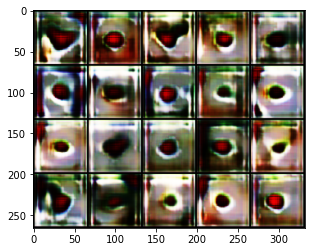

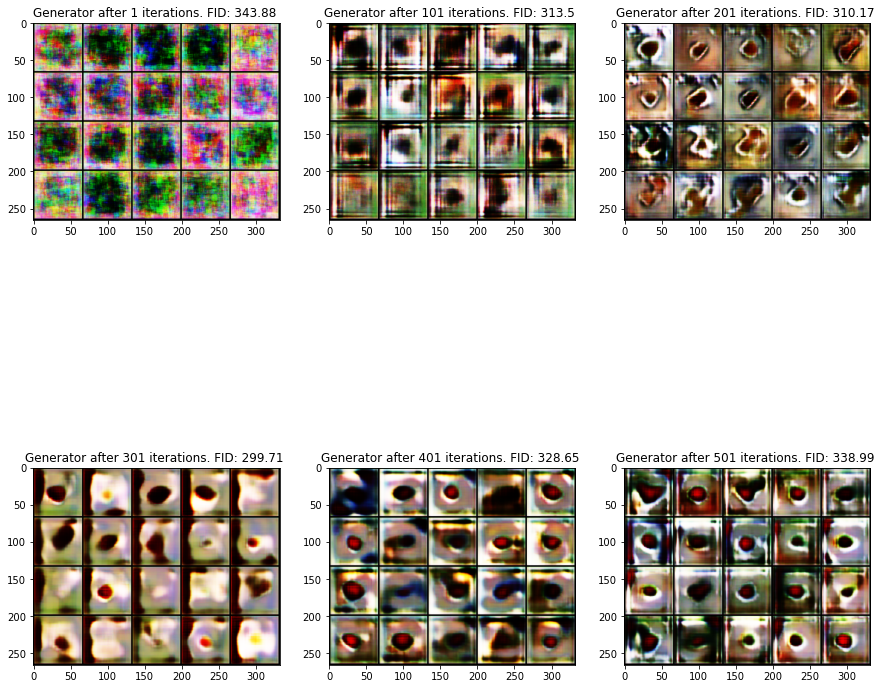

In [176]:
imgs_list,iteration_out,fids,Loss_D,Loss_G = set_xep2(num_iterations=501,fid_n=100)

Iterations: 1,Fid: 333.61
Iterations: 1001,Fid: 236.57
Iterations: 2001,Fid: 221.07
Iterations: 3001,Fid: 201.87
Iterations: 4001,Fid: 181.75
Iterations: 5001,Fid: 163.87
Iterations: 6001,Fid: 162.56
Iterations: 7001,Fid: 155.43
Iterations: 8001,Fid: 159.56
Iterations: 9001,Fid: 148.35
total step: 10001
Iterations: 10001,Fid: 161.79


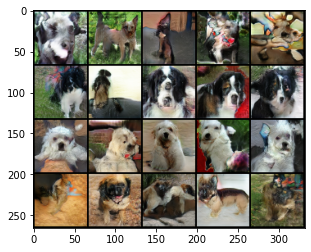

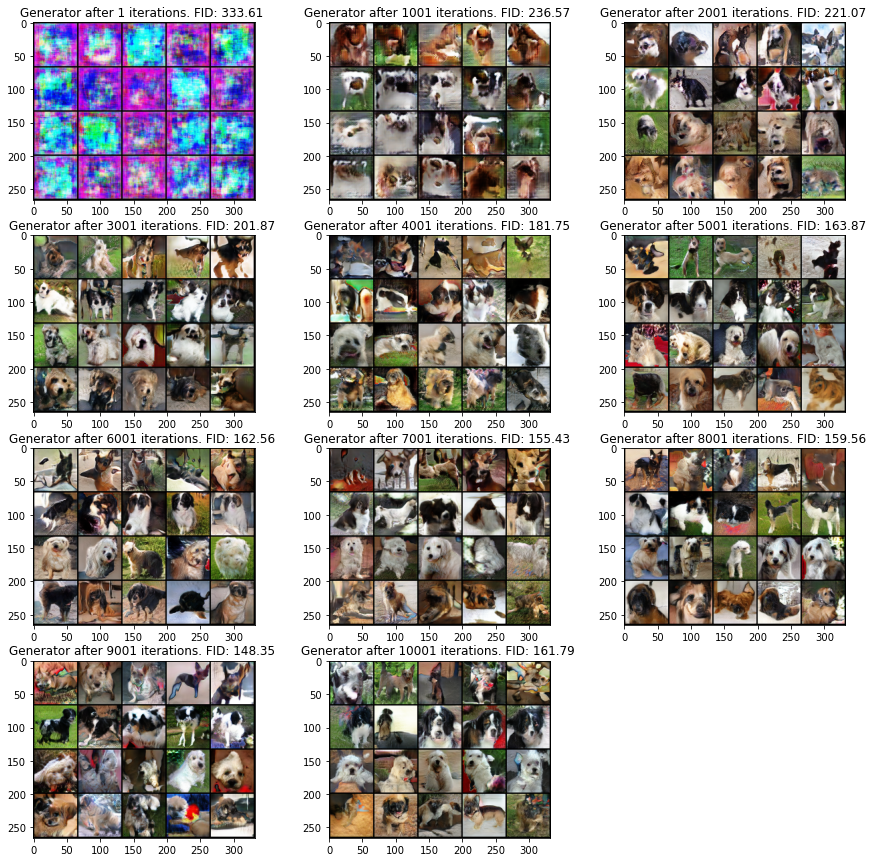

In [69]:
imgs_list,iteration_out,fids = set_xep2(10001,1000)

In [70]:
np.save(r'C:\private\afeka\cv\gan\imgs_att', imgs_list)
np.save(r'C:\private\afeka\cv\gan\itt_att', iteration_out)
np.save(r'C:\private\afeka\cv\gan\fid_att', fids)

No attention in generator
***

No attention in discriminator
***

Iterations: 1,Fid: 343.91
Iterations: 1001,Fid: 234.15
Iterations: 2001,Fid: 204.21
Iterations: 3001,Fid: 203.75
Iterations: 4001,Fid: 182.7
Iterations: 5001,Fid: 176.26
Iterations: 6001,Fid: 157.15
Iterations: 7001,Fid: 175.92
Iterations: 8001,Fid: 161.5
Iterations: 9001,Fid: 156.21
total step: 10001
Iterations: 10001,Fid: 147.72


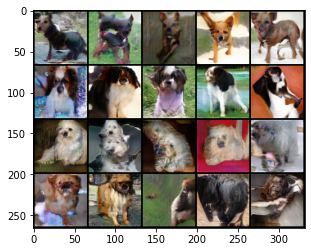

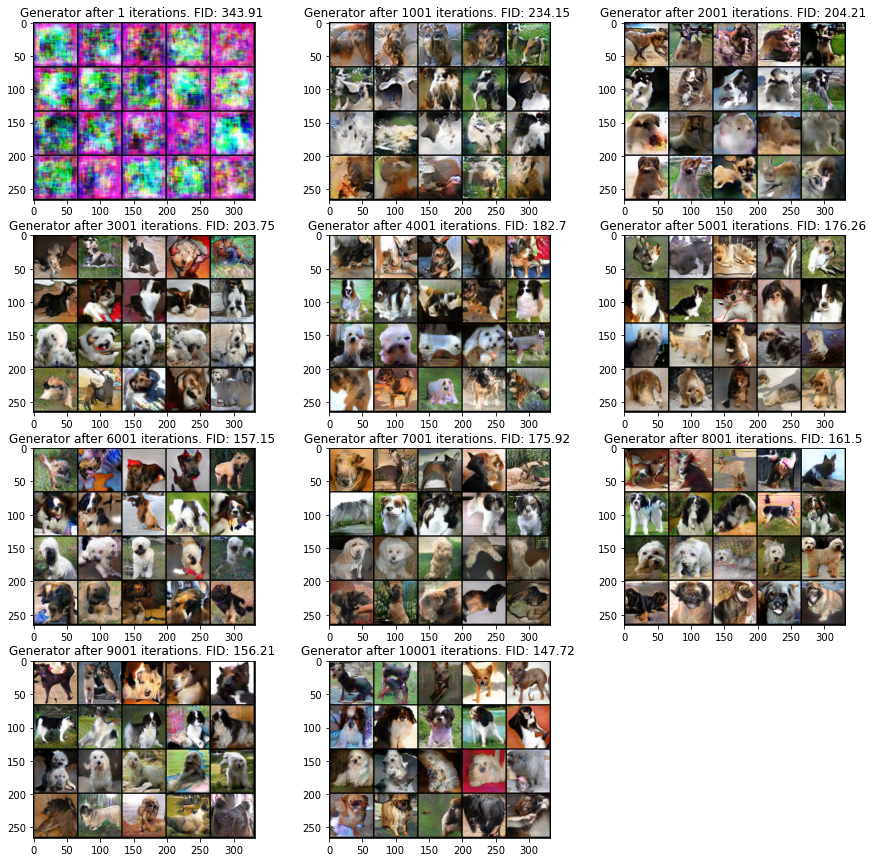

In [79]:
#10000 iterations
imgs_list_no_att_D10001,iteration_out_no_att_D10001,fids_no_att_D10001 = set_xep2(10001,1000,True,False)
np.save(r'C:\private\afeka\cv\gan\imgs_list_no_att_D10001', imgs_list_no_att_D10001)
np.save(r'C:\private\afeka\cv\gan\iteration_out_no_att_D10001', iteration_out_no_att_D10001)
np.save(r'C:\private\afeka\cv\gan\fids_no_att_D10001', fids_no_att_D10001)

No attention at all
***

Iterations: 1,Fid: 345.12
Iterations: 1001,Fid: 227.65
Iterations: 2001,Fid: 225.35
Iterations: 3001,Fid: 203.02
Iterations: 4001,Fid: 155.26
Iterations: 5001,Fid: 180.3
Iterations: 6001,Fid: 161.72
Iterations: 7001,Fid: 167.02
Iterations: 8001,Fid: 152.1
Iterations: 9001,Fid: 152.45
total step: 10001
Iterations: 10001,Fid: 149.77


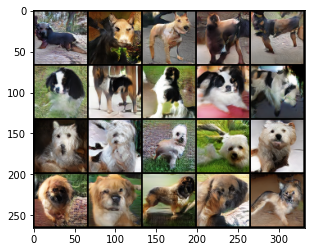

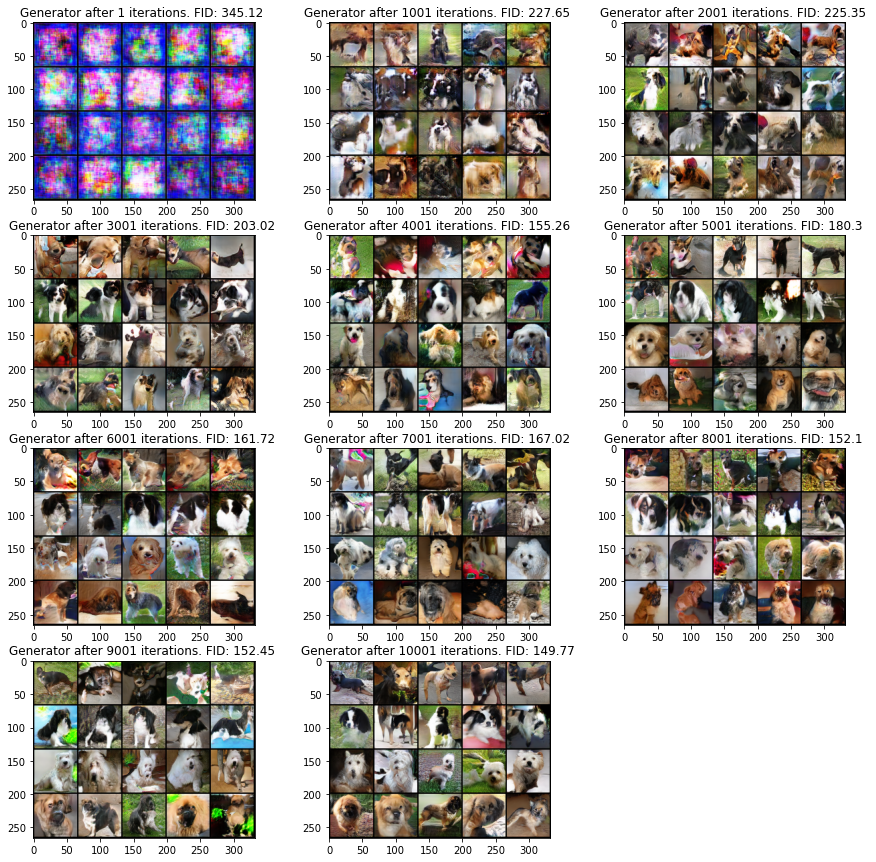

In [82]:
#10000 iterations
imgs_list_no_att10001,iteration_out_no_att10001,fids_no_att10001 = set_xep2(10001,1000,False,False)
np.save(r'C:\private\afeka\cv\gan\imgs_list_no_att10001', imgs_list_no_att10001)
np.save(r'C:\private\afeka\cv\gan\iteration_out_no_att10001', iteration_out_no_att10001)
np.save(r'C:\private\afeka\cv\gan\fids_no_att10001', fids_no_att10001)

Iterations: 1,Fid: 354.26
Iterations: 2001,Fid: 216.95
Iterations: 4001,Fid: 169.78
Iterations: 6001,Fid: 157.43
Iterations: 8001,Fid: 147.17
Iterations: 10001,Fid: 146.71
Iterations: 12001,Fid: 133.99
Iterations: 14001,Fid: 152.75
Iterations: 16001,Fid: 139.94
Iterations: 18001,Fid: 135.63
total step: 20001
Iterations: 20001,Fid: 132.95


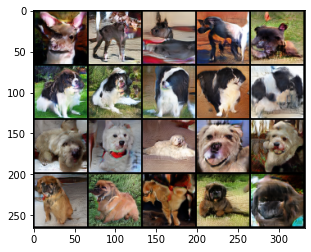

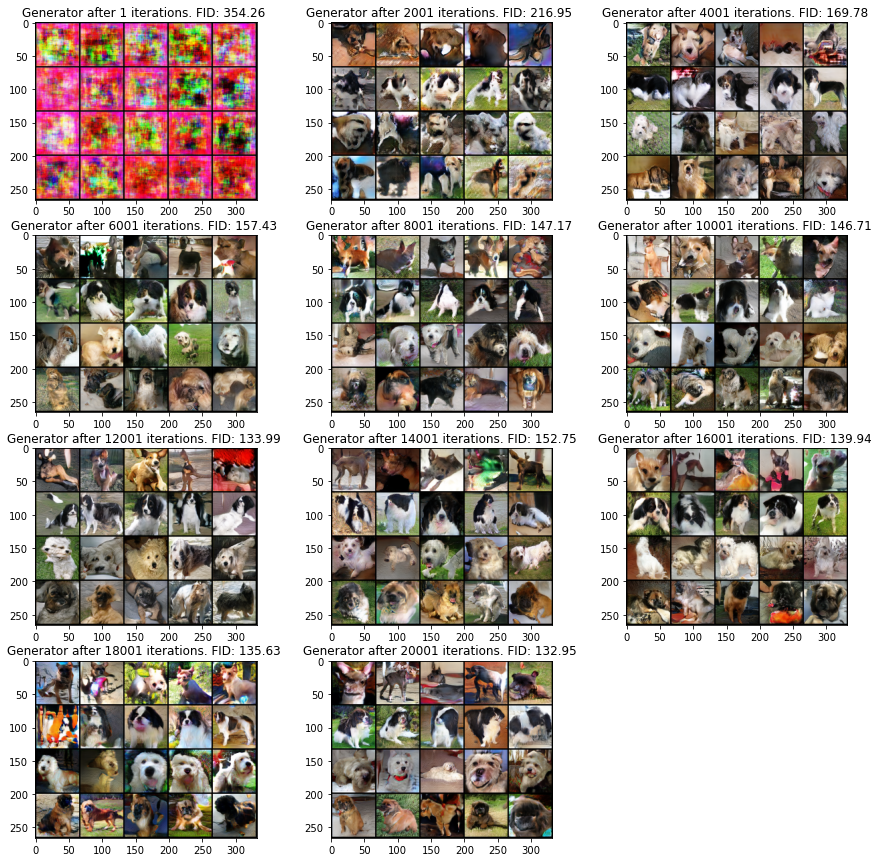

In [85]:
#20000 iterations
imgs_list_attG20001,iteration_attG20001,fids_attG20001 = set_xep2(20001,2000,False)
np.save(r'C:\private\afeka\cv\gan\imgs_list_attG20001', imgs_list_attG20001)
np.save(r'C:\private\afeka\cv\gan\iteration_attG20001', iteration_attG20001)
np.save(r'C:\private\afeka\cv\gan\fids_attG20001', fids_attG20001)

Check  and compare loss
***

Iterations: 1,Fid: 352.79, Loss_D: 2.214, Loss_G: 20.855
Iterations: 1001,Fid: 282.3, Loss_D: 0.922, Loss_G: 3.543
Iterations: 2001,Fid: 235.07, Loss_D: 0.963, Loss_G: 4.141
Iterations: 3001,Fid: 194.86, Loss_D: 0.718, Loss_G: 4.297
Iterations: 4001,Fid: 192.35, Loss_D: 0.697, Loss_G: 4.322
Iterations: 5001,Fid: 191.83, Loss_D: 0.723, Loss_G: 4.104
Iterations: 6001,Fid: 162.97, Loss_D: 0.62, Loss_G: 4.241
Iterations: 7001,Fid: 169.63, Loss_D: 0.584, Loss_G: 4.134
Iterations: 8001,Fid: 166.56, Loss_D: 0.487, Loss_G: 4.016
Iterations: 9001,Fid: 163.61, Loss_D: 0.485, Loss_G: 4.576
total step: 10001
Iterations: 10001,Fid: 156.32, Loss_D: 0.44, Loss_G: 4.365


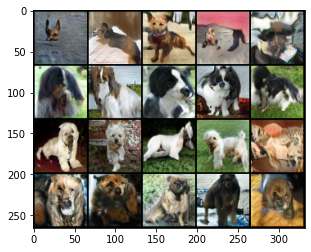

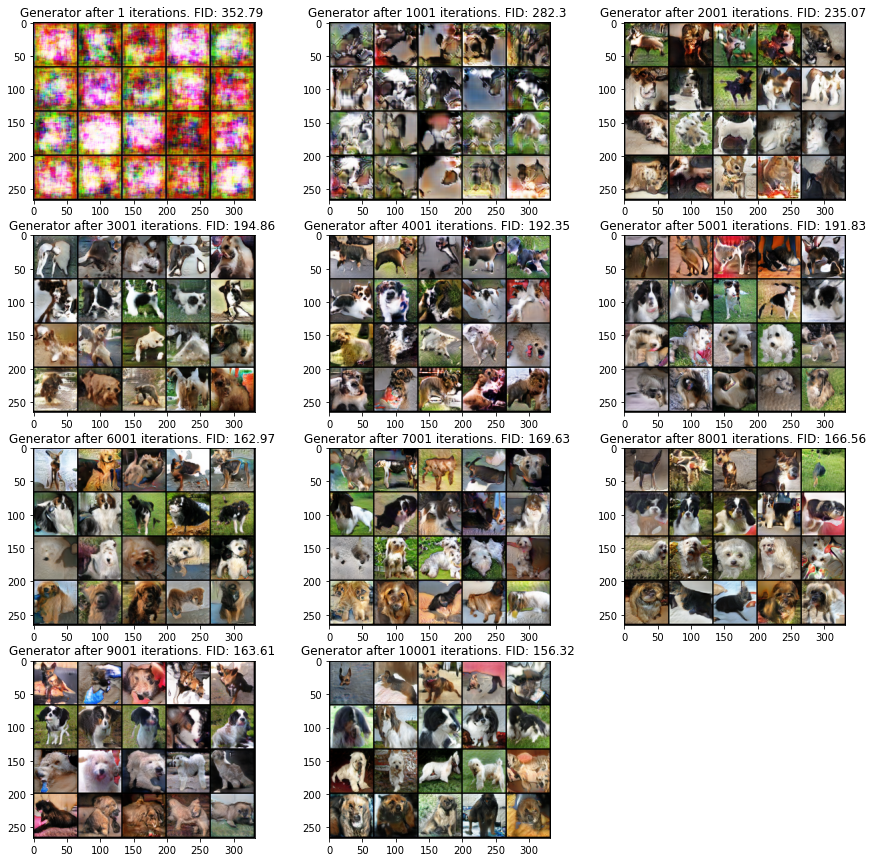

In [177]:
#10000 iterations with Loss attention full
imgs_listL,iteration_outL,fidsL,ALoss_D,ALoss_G = set_xep2(10001,1000)

np.save(r'C:\private\afeka\cv\gan\imgs_listL', imgs_listL)
np.save(r'C:\private\afeka\cv\gan\iteration_outL', iteration_outL)
np.save(r'C:\private\afeka\cv\gan\fidsL', fidsL)
np.save(r'C:\private\afeka\cv\gan\ALoss_D', ALoss_D)
np.save(r'C:\private\afeka\cv\gan\ALoss_G', ALoss_G)


Iterations: 1,Fid: 355.03, Loss_D: 1.418, Loss_G: 78.865
Iterations: 1001,Fid: 269.21, Loss_D: 1.092, Loss_G: 2.927
Iterations: 2001,Fid: 233.24, Loss_D: 0.95, Loss_G: 2.956
Iterations: 3001,Fid: 216.25, Loss_D: 0.744, Loss_G: 4.098
Iterations: 4001,Fid: 189.68, Loss_D: 0.71, Loss_G: 4.313
Iterations: 5001,Fid: 191.37, Loss_D: 0.67, Loss_G: 3.677
Iterations: 6001,Fid: 178.18, Loss_D: 0.6, Loss_G: 4.103
Iterations: 7001,Fid: 160.0, Loss_D: 0.568, Loss_G: 4.276
Iterations: 8001,Fid: 170.04, Loss_D: 0.454, Loss_G: 4.2
Iterations: 9001,Fid: 157.34, Loss_D: 0.48, Loss_G: 4.653
total step: 10001
Iterations: 10001,Fid: 150.11, Loss_D: 0.397, Loss_G: 3.787


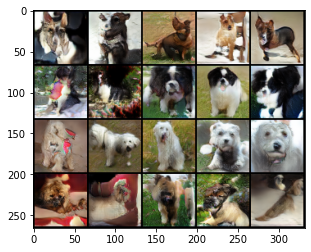

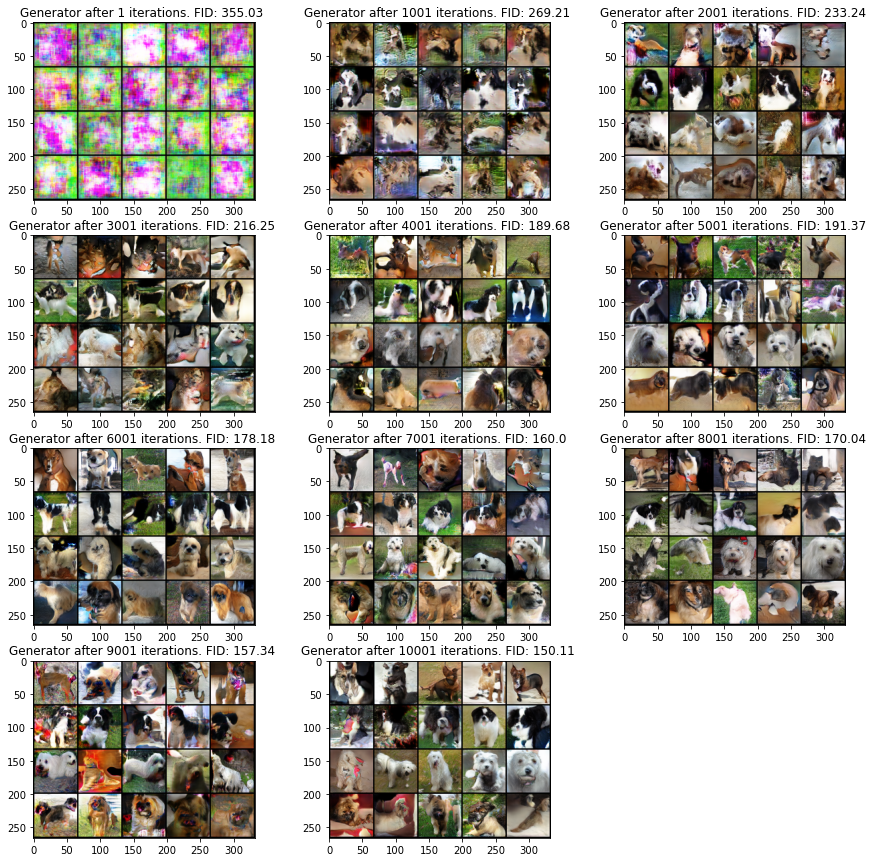

In [180]:
#10000 iterations with Loss no attention
imgs_no_10000L,iteration_no_10000L,fids_no_10000L,NO_Loss_D,NO_GLoss_G = set_xep2(10001,1000,False,False)
np.save(r'C:\private\afeka\cv\gan\imgs_att_no_G10000', imgs_no_10000L)
np.save(r'C:\private\afeka\cv\gan\itt_att_no_G10000', iteration_no_10000L)
np.save(r'C:\private\afeka\cv\gan\fid_att_no_G10000', fids_no_10000L)
np.save(r'C:\private\afeka\cv\gan\GLoss_D', NO_Loss_D)
np.save(r'C:\private\afeka\cv\gan\GLoss_G', NO_GLoss_G)

Iterations: 1,Fid: 364.69, Loss_D: 1.074, Loss_G: 42.213
Iterations: 3001,Fid: 204.13, Loss_D: 0.833, Loss_G: 3.884
Iterations: 6001,Fid: 179.14, Loss_D: 0.641, Loss_G: 4.512
Iterations: 9001,Fid: 163.94, Loss_D: 0.445, Loss_G: 4.421
Iterations: 12001,Fid: 144.23, Loss_D: 0.465, Loss_G: 4.908
Iterations: 15001,Fid: 137.82, Loss_D: 0.335, Loss_G: 3.892
Iterations: 18001,Fid: 139.34, Loss_D: 0.257, Loss_G: 4.634
Iterations: 21001,Fid: 135.65, Loss_D: 0.262, Loss_G: 4.452
Iterations: 24001,Fid: 147.28, Loss_D: 0.158, Loss_G: 4.458


C:\Users\urial\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:131: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn("Detected call of `lr_scheduler.step()` before `optimizer.step()`. "


Iterations: 27001,Fid: 128.48, Loss_D: 0.179, Loss_G: 4.178
total step: 30001
Iterations: 30001,Fid: 140.19, Loss_D: 0.157, Loss_G: 3.936


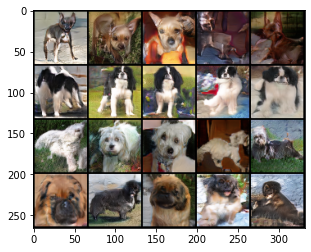

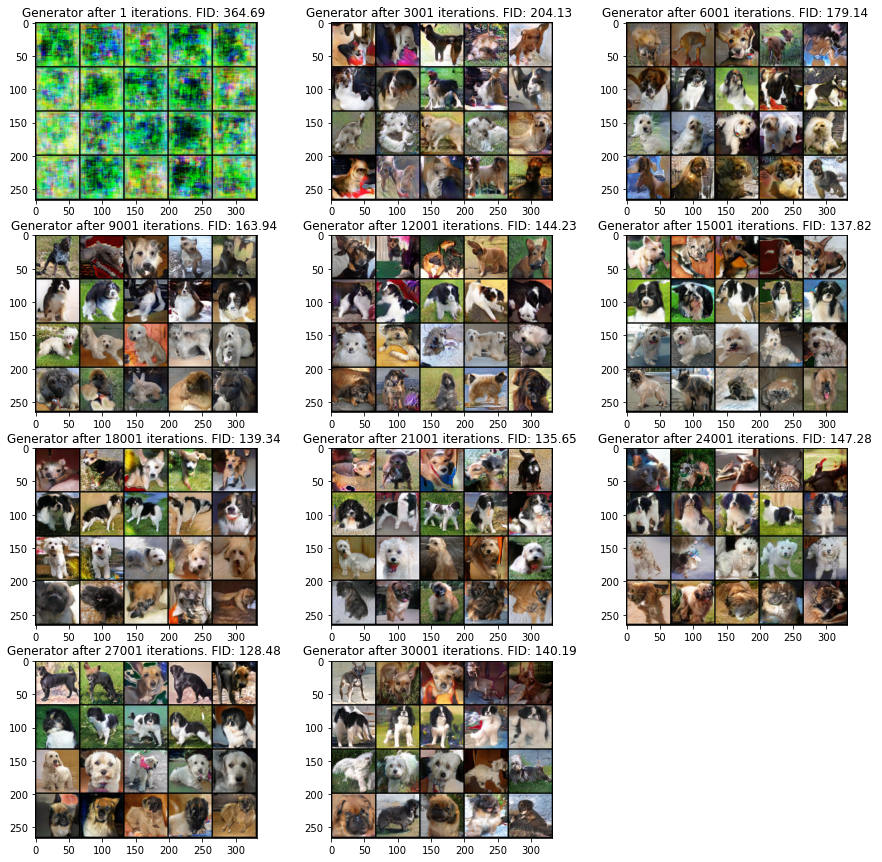

In [181]:
#30000 iterations with Loss attention full
imgs_listL3,iteration_outL3,fidsL3,ALoss_D3,ALoss_G3 = set_xep2(30001,3000)

np.save(r'C:\private\afeka\cv\gan\imgs_listL3', imgs_listL3)
np.save(r'C:\private\afeka\cv\gan\iteration_outL3', iteration_outL3)
np.save(r'C:\private\afeka\cv\gan\fidsL3', fidsL3)
np.save(r'C:\private\afeka\cv\gan\ALoss_D3', ALoss_D3)
np.save(r'C:\private\afeka\cv\gan\ALoss_G3', ALoss_G3)

Plots
***

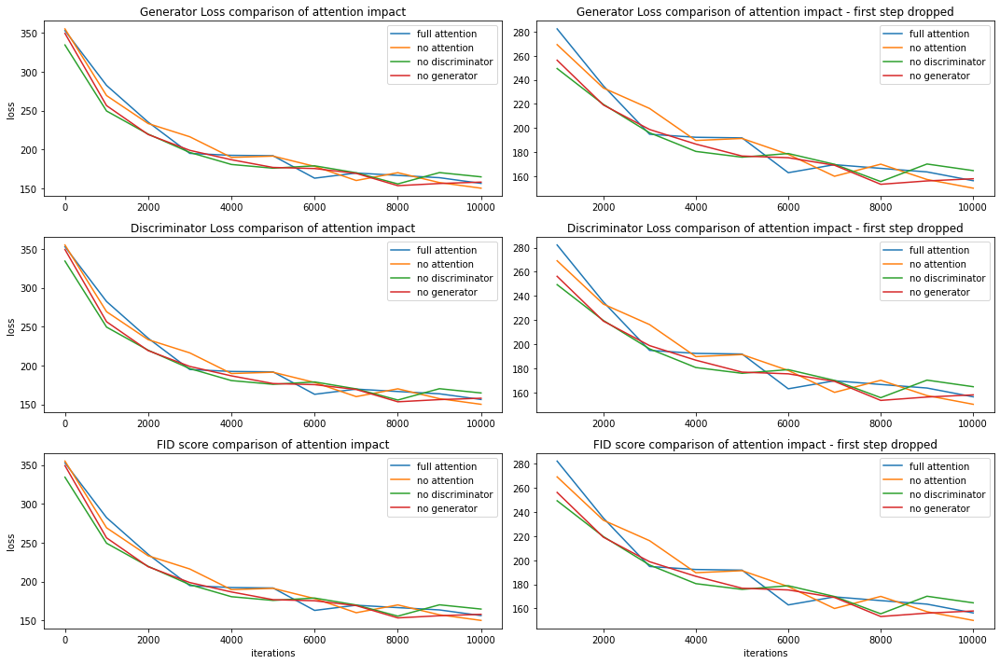

In [184]:
#Generator loss comparison by attention
attention = np.load(r'C:\private\afeka\cv\gan\ALoss_G.npy')#[1.418,1.092,0.95,0.744,0.71,0.67,0.6,0.568,0.454,0.48,0.397]
No_Att = np.load(r'C:\private\afeka\cv\gan\GLoss_G.npy')#[78.865,2.927,2.956,4.098,4.313,3.677,4.103,4.276,4.2,4.653,3.787]#=[1.416,1.119, 0.804,0.733,0.715,0.545,0.542,0.47,0.46,0.515,0.449]
discriminator = [13.77,2.501,3.612,4.39,4.167,4.248,4.466,4.071,3.551,4.49,4.144]
generator = np.load(r'C:\private\afeka\cv\gan\DLoss_G.npy')
#discriminator loss comparison by attention
attention = np.load(r'C:\private\afeka\cv\gan\ALoss_D.npy')#[1.418,1.092,0.95,0.744,0.71,0.67,0.6,0.568,0.454,0.48,0.397]
No_Att =np.load(r'C:\private\afeka\cv\gan\GLoss_D.npy')#[1.418,1.092,0.95,0.744,0.71,0.67,0.6,0.568,0.454,0.48,0.397]
discriminator = [3.416,1.119,0.804,0.733,0.715,0.545,0.542,0.47,0.46,0.515,0.449]
generator = np.load(r'C:\private\afeka\cv\gan\DLoss_D.npy')

#FID loss comparison by attention
attention = np.load(r'C:\private\afeka\cv\gan\fidsL.npy')#[1.418,1.092,0.95,0.744,0.71,0.67,0.6,0.568,0.454,0.48,0.397]
No_Att =np.load(r'C:\private\afeka\cv\gan\fid_att_no_G10000.npy')#[1.418,1.092,0.95,0.744,0.71,0.67,0.6,0.568,0.454,0.48,0.397]
discriminator = [334.32,249.39,219.67,196.09,180.62,175.84,178.87,169.93,155.6,170.17,164.7]
generator = np.load(r'C:\private\afeka\cv\gan\fids_no_D10000L.npy')

plt.figure(figsize=(15,10))
plt.subplot(3,2,1)
plt.plot(np.arange(0,10001,1000),attention)
plt.plot(np.arange(0,10001,1000),No_Att)
plt.plot(np.arange(0,10001,1000),discriminator)
plt.plot(np.arange(0,10001,1000),generator)
plt.legend(('full attention','no attention','no discriminator','no generator'))
plt.title('Generator Loss comparison of attention impact')
# plt.xlabel('iterations')
plt.ylabel('loss')
plt.subplot(3,2,2)
plt.plot(np.arange(1000,10001,1000),attention[1:])
plt.plot(np.arange(1000,10001,1000),No_Att[1:])
plt.plot(np.arange(1000,10001,1000),discriminator[1:])
plt.plot(np.arange(1000,10001,1000),generator[1:])
plt.legend(('full attention','no attention','no discriminator','no generator'))
plt.title('Generator Loss comparison of attention impact - first step dropped')
# plt.xlabel('iterations')
# plt.ylabel('loss')

plt.subplot(3,2,3)
plt.plot(np.arange(0,10001,1000),attention)
plt.plot(np.arange(0,10001,1000),No_Att)
plt.plot(np.arange(0,10001,1000),discriminator)
plt.plot(np.arange(0,10001,1000),generator)
plt.legend(('full attention','no attention','no discriminator','no generator'))
plt.title('Discriminator Loss comparison of attention impact')
# plt.xlabel('iterations')
plt.ylabel('loss')
plt.subplot(3,2,4)
plt.plot(np.arange(1000,10001,1000),attention[1:])
plt.plot(np.arange(1000,10001,1000),No_Att[1:])
plt.plot(np.arange(1000,10001,1000),discriminator[1:])
plt.plot(np.arange(1000,10001,1000),generator[1:])
plt.legend(('full attention','no attention','no discriminator','no generator'))
plt.title('Discriminator Loss comparison of attention impact - first step dropped')
# plt.xlabel('iterations')
# plt.ylabel('loss')

plt.subplot(3,2,5)
plt.plot(np.arange(0,10001,1000),attention)
plt.plot(np.arange(0,10001,1000),No_Att)
plt.plot(np.arange(0,10001,1000),discriminator)
plt.plot(np.arange(0,10001,1000),generator)
plt.legend(('full attention','no attention','no discriminator','no generator'))
plt.title('FID score comparison of attention impact')
plt.xlabel('iterations')
plt.ylabel('loss')
plt.subplot(3,2,6)
plt.plot(np.arange(1000,10001,1000),attention[1:])
plt.plot(np.arange(1000,10001,1000),No_Att[1:])
plt.plot(np.arange(1000,10001,1000),discriminator[1:])
plt.plot(np.arange(1000,10001,1000),generator[1:])
plt.legend(('full attention','no attention','no discriminator','no generator'))
plt.title('FID score comparison of attention impact - first step dropped')
plt.xlabel('iterations')
# plt.ylabel('loss')
plt.tight_layout()

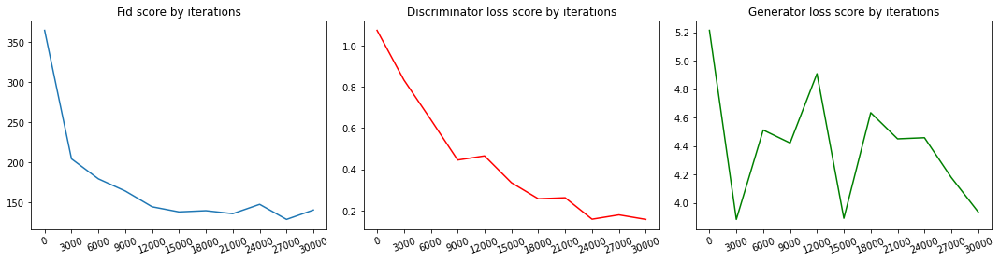

In [187]:
Fid_final = [364.69,204.13,179.14,163.94,144.23,137.82,139.34,135.65,147.28,128.48,140.19]
Loss_D_final=[1.074,0.833,0.641,0.445,0.465,0.335,0.257,0.262,0.158,0.179,0.157]
Loss_G_final =[5.213,3.884,4.512,4.421,4.908,3.892,4.634,4.45,4.458,4.178,3.936]
iterations = np.arange(0,30001,3000)
plt.figure(figsize=(15,4))

plt.subplot(1,3,1)
plt.plot(iterations,Fid_final)
plt.title('Fid score by iterations')
plt.xticks(iterations,rotation=20)

plt.subplot(1,3,2)
plt.plot(iterations,Loss_D_final,color='red')
plt.xticks(iterations,rotation=20)
plt.title('Discriminator loss score by iterations')
plt.subplot(1,3,3)
plt.plot(iterations,Loss_G_final,color='green')
plt.xticks(iterations,rotation=20)
plt.title('Generator loss score by iterations')

plt.tight_layout()